# Setup project

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


You need to forward the Oxford5k dataset to your own drive first and then adjust the path below to match the dataset's location after forwarding. https://drive.google.com/drive/folders/1DEQiVclh09cusnQtJMcmTriekCJzVh6g?usp=sharing

## oxford5k dataset

In [ ]:
!cp /content/drive/MyDrive/Dataset/oxford5k -r /content

## logo2k dataset

In [ ]:
!cp /content/drive/MyDrive/Logo-2k+/Logo-2K+.zip -r /content

In [ ]:
!cp /content/drive/MyDrive/Logo-2k+/train_and_test.zip -r /content
!unzip /content/train_and_test.zip

Streaming output truncated to the last 5000 lines.
  inflating: train_and_test/train/Transportation/Kuwahara/58.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/59.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/60.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/64.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/65.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/66.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/67.jpg  
  inflating: train_and_test/train/Transportation/Kuwahara/68.jpg  
   creating: train_and_test/train/Transportation/Lada/
  inflating: train_and_test/train/Transportation/Lada/1.jpg  
  inflating: train_and_test/train/Transportation/Lada/10.jpg  
  inflating: train_and_test/train/Transportation/Lada/11.jpg  
  inflating: train_and_test/train/Transportation/Lada/12.jpg  
  inflating: train_and_test/train/Transportation/Lada/13.jpg  
  inflating: train_and_test/train/Transporta

In [ ]:
!unzip /content/Logo-2K+.zip

Streaming output truncated to the last 5000 lines.
  inflating: Logo-2K+/Transportation/Montague/55.jpg  
  inflating: Logo-2K+/Transportation/Montague/56.jpg  
  inflating: Logo-2K+/Transportation/Montague/57.jpg  
  inflating: Logo-2K+/Transportation/Montague/58.jpg  
  inflating: Logo-2K+/Transportation/Montague/59.jpg  
  inflating: Logo-2K+/Transportation/Montague/6.jpg  
  inflating: Logo-2K+/Transportation/Montague/60.jpg  
  inflating: Logo-2K+/Transportation/Montague/61.jpg  
  inflating: Logo-2K+/Transportation/Montague/62.jpg  
  inflating: Logo-2K+/Transportation/Montague/63.jpg  
  inflating: Logo-2K+/Transportation/Montague/64.jpg  
  inflating: Logo-2K+/Transportation/Montague/65.jpg  
  inflating: Logo-2K+/Transportation/Montague/66.jpg  
  inflating: Logo-2K+/Transportation/Montague/67.jpg  
  inflating: Logo-2K+/Transportation/Montague/68.jpg  
  inflating: Logo-2K+/Transportation/Montague/7.jpg  
  inflating: Logo-2K+/Transportation/Montague/8.jpg  
  inflating: Logo

## setup environments

In [ ]:
!pip install -q condacolab

In [ ]:
import condacolab
condacolab.install()
!pip install transformers datasets &> /dev/null
!mamba install -c pytorch faiss-gpu

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.11.0-0/Mambaforge-23.11.0-0-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:18
🔁 Restarting kernel...

Looking for: ['faiss-gpu']

[+] 0.0s
pytorch/linux-64 (..  ⣾  [+] 0.1s
pytorch/linux-64 (..  ⣾  pytorch/linux-64 (check zst)                      
[+] 0.0s
pytorch/noarch (ch..  ⣾  pytorch/noarch (check zst)                        
[+] 0.0s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  
pytorch/linux-64      ⣾  
pytorch/noarch        ⣾  [+] 0.1s
conda-forge/linux-64  ⣾  
conda-forge/noarch    ⣾  
pytorch/linux-64       8%
pytorch/noarch        ⣾  pytorch/linux-64                                  
pytorch/noarch                                    
[+] 0.2s
conda-forge/linux-64   1%
conda-forge/noarch     1%[+] 0.3s
conda-forge/linux-64   7%
conda-forge/noarch    16%[+] 0.4s
conda-forge/linux-64  15%
conda-forge/noarch    33%[+] 0.5s
conda-forge/linux

# Import libraries

In [ ]:
import time
import numpy as np
import faiss
import torch
from transformers import CLIPModel, CLIPProcessor
from PIL import Image, ImageFilter, ImageOps
import requests
import glob
from tqdm.notebook import tqdm
import numpy as np
import json
import pandas as pd

# Initailize Model

In [ ]:
class CLIPFeatureExtractor:
    def __init__(self):
        model_name = "laion/CLIP-ViT-H-14-laion2B-s32B-b79K"
        self.model = CLIPModel.from_pretrained(model_name)
        self.processor = CLIPProcessor.from_pretrained(model_name)
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model.to(self.device)

    @torch.no_grad()
    def get_text_features(self, text):
        inputs = self.processor(text=text, return_tensors="pt")
        inputs = inputs.to(self.device)
        text_features = self.model.get_text_features(**inputs)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        text_features = text_features.tolist()
        return text_features

    @torch.no_grad()
    def get_image_features(self, images):
        inputs = self.processor(images=images, return_tensors="pt")
        inputs = inputs.to(self.device)
        image_features = self.model.get_image_features(**inputs)
        image_features /= image_features.norm(dim=-1, keepdim=True)
        image_features = image_features.detach().cpu().numpy()
        return image_features.flatten()

In [ ]:
processor = CLIPFeatureExtractor()

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.94G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
def encode(path: str, mode):
    files = sorted(glob.glob(path))
    temp = []
    for i in tqdm(files):
        image = Image.open(i)
        image = image.resize((512, 512))
        # image = image.resize((512*2, 512*2))
        if mode == 'test':
          ##BLUR_____________________________________________
          image = image.filter(ImageFilter.BLUR)
        try:
          image = ImageOps.autocontrast(image)
        except:
          pass
        temp.append(processor.get_image_features(image))

    return [np.array(temp), files]

In [ ]:
query, query_images = encode("oxford5k/query/*.jpg", mode='test')

  0%|          | 0/70 [00:00<?, ?it/s]

In [ ]:
gallery, gallery_images = encode("oxford5k/gallery/*.jpg", mode='gal')

  0%|          | 0/4993 [00:00<?, ?it/s]

In [ ]:
from numpy.core.multiarray import dtype
def find_dynamic_threshold(gallery, top_n = 50):
  d =  1024
  index = faiss.IndexFlatL2(d)   # build the index
  index.add(gallery)             # add vectors to the index
  Dx, Ix = index.search(gallery, top_n)
  Dx = Dx.squeeze()
  mean_Dx = np.mean(Dx)
  DT = np.mean(Dx, axis=1)-mean_Dx
  dynamic_threshold = {}

  for i in range(len(DT)):
    dynamic_threshold[gallery_images[i].split('/')[-1].split('.')[0]] = DT[i]

  return dynamic_threshold

In [ ]:
# Find the distance between each query and the matched gallery.
d =  1024
index = faiss.IndexFlatL2(d)   # build the index
index.add(gallery)             # add vectors to the index

# Find the distance between each test sample and the matched query.
start_time = time.time()
D, I = index.search(query, 600)     # actual search
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.14143848419189453 seconds ---


In [ ]:
D

array([[0.28072286, 0.28110552, 0.28267097],
       [0.3741057 , 0.3779075 , 0.3865546 ],
       [0.5809367 , 0.60210097, 0.62198853],
       [0.2253412 , 0.2345587 , 0.23544621],
       [0.19328082, 0.19649136, 0.20233631],
       [0.3345052 , 0.35519135, 0.37561953],
       [0.5189202 , 0.540084  , 0.5552707 ],
       [0.66941154, 0.6974386 , 0.762203  ],
       [0.567978  , 0.6740962 , 0.69818723],
       [0.6293204 , 0.66404045, 0.698951  ],
       [0.77595913, 0.7784463 , 0.8239826 ],
       [0.6464224 , 0.6749207 , 0.7225548 ],
       [0.6638218 , 0.7441387 , 0.7448629 ],
       [0.58984554, 0.61077535, 0.6154574 ],
       [0.19873893, 0.23588896, 0.246665  ],
       [0.37992895, 0.38106823, 0.39100897],
       [0.32902646, 0.36126363, 0.3626988 ],
       [0.41495347, 0.42144394, 0.4216957 ],
       [0.3790679 , 0.38511658, 0.40774298],
       [0.4340018 , 0.46540058, 0.4718343 ],
       [0.15043998, 0.15378022, 0.15692782],
       [0.41556513, 0.4295057 , 0.46390772],
       [0.

# Oxford5k Evaluation

In [ ]:
def calculate_f1(precision, recall):
    if precision + recall == 0:
        return 0
    return 2 * (precision * recall) / (precision + recall)

def f1_macro_average(true_dict, predict_dict):
    total_f1 = 0.0
    for query, gallery in true_dict.items():
        if query in predict_dict:
            predicted_values = predict_dict[query]
            true_positives = len(set(predicted_values) & set(gallery))
            if len(predicted_values) == 0:
                precision = 0
            else:
                precision = true_positives / len(predicted_values)
            if len(gallery) == 0:
                recall = 0
            else:
                recall = true_positives / len(gallery)
            f1_score = calculate_f1(precision, recall)
            total_f1 += f1_score
    if len(true_dict) == 0:
        return 0
    return total_f1 / len(true_dict)

In [ ]:
with open("/content/oxford5k/ground_truth_easy.json") as file:
  ground_truth_easy = json.load(file)
ground_truth_easy

# with open("/content/rparis6k/ground_truth_easy.json") as file:
#   ground_truth_easy = json.load(file)
# ground_truth_easy

{'all_souls_000013': ['all_souls_000153',
  'all_souls_000126',
  'all_souls_000055',
  'oxford_000130',
  'all_souls_000091',
  'all_souls_000073',
  'oxford_000177',
  'all_souls_000001',
  'all_souls_000064',
  'oxford_000926',
  'hertford_000039',
  'all_souls_000040',
  'all_souls_000146',
  'oxford_002503',
  'all_souls_000041',
  'all_souls_000093',
  'all_souls_000105',
  'oxford_001308',
  'all_souls_000048',
  'all_souls_000103',
  'all_souls_000214',
  'oxford_000669',
  'all_souls_000014',
  'oxford_000262',
  'all_souls_000148',
  'all_souls_000065',
  'all_souls_000133',
  'oxford_000478',
  'all_souls_000090',
  'all_souls_000197',
  'all_souls_000134',
  'all_souls_000150',
  'oxford_002358',
  'all_souls_000015',
  'all_souls_000035',
  'all_souls_000161',
  'all_souls_000209',
  'all_souls_000066',
  'oxford_001264',
  'oxford_001955',
  'oxford_000962',
  'oxford_003521',
  'all_souls_000157',
  'all_souls_000184',
  'hertford_000112',
  'all_souls_000072',
  'all_so

## Static threshold

In [ ]:
ground_truth = ground_truth_easy
# ground_truth = ground_truth_hard

for threshold in range(1,20):
  predict_dict = {}
  static_threshold = threshold * 0.1

  for idx, query_file in enumerate(query_images):
    values_list = []
    for j in range(50):
      if D[idx][j] <= static_threshold:
            values_list += [gallery_images[I[idx][j]].split('/')[-1].split(".")[0]]
    predict_dict[query_file.split("/")[-1].split(".")[0]] = values_list
  f1_macro = f1_macro_average(ground_truth, predict_dict)
  print(f"F1 Macro Average Score {threshold}:", f1_macro)

F1 Macro Average Score 1: 0.0
F1 Macro Average Score 2: 0.026859643828548423
F1 Macro Average Score 3: 0.08579767671272716
F1 Macro Average Score 4: 0.2708911963067228
F1 Macro Average Score 5: 0.28437872056367564
F1 Macro Average Score 6: 0.2943539470236239
F1 Macro Average Score 7: 0.30204102241473524
F1 Macro Average Score 8: 0.2874082418077354
F1 Macro Average Score 9: 0.28286824422061363
F1 Macro Average Score 10: 0.2767175446850607
F1 Macro Average Score 11: 0.274006921974438
F1 Macro Average Score 12: 0.274006921974438
F1 Macro Average Score 13: 0.274006921974438
F1 Macro Average Score 14: 0.274006921974438
F1 Macro Average Score 15: 0.274006921974438
F1 Macro Average Score 16: 0.274006921974438
F1 Macro Average Score 17: 0.274006921974438
F1 Macro Average Score 18: 0.274006921974438
F1 Macro Average Score 19: 0.274006921974438


## Dynamic threshold

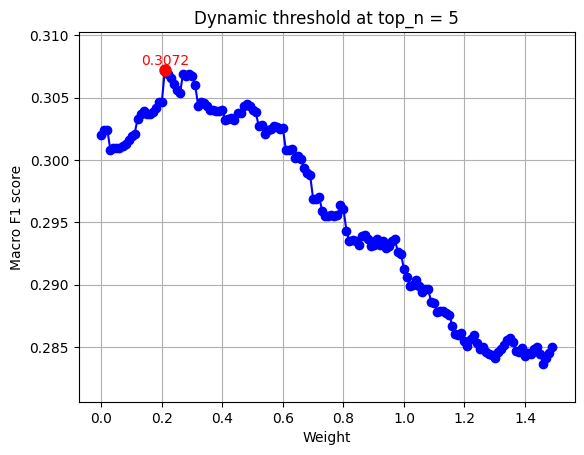

Max Macro F1 score at weight:  0.21
F1 score: 0.30724833954485825


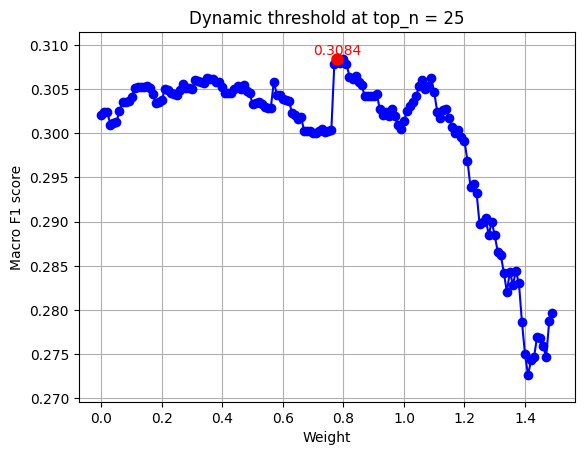

Max Macro F1 score at weight:  0.78
F1 score: 0.3084435665790984


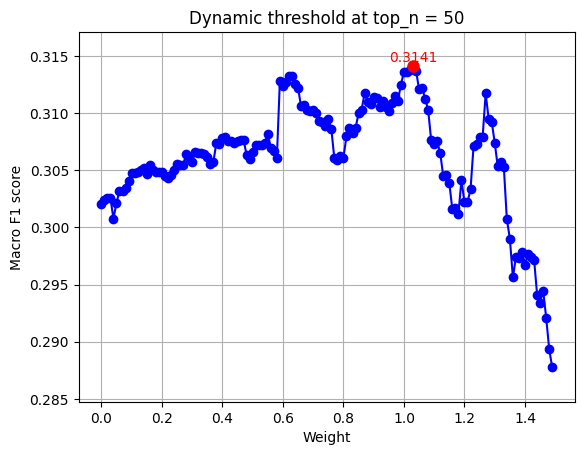

Max Macro F1 score at weight:  1.03
F1 score: 0.3140911279315673


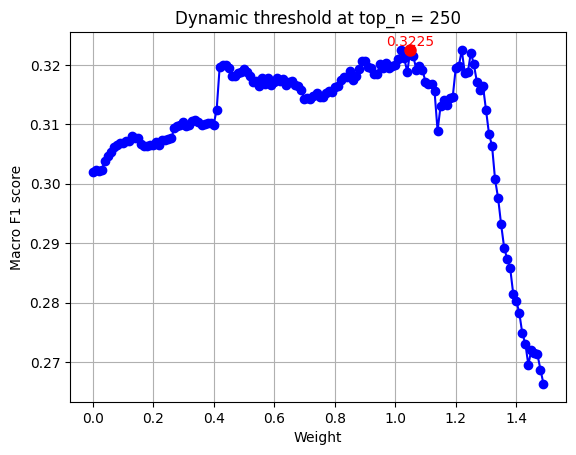

Max Macro F1 score at weight:  1.05
F1 score: 0.3225114257495878


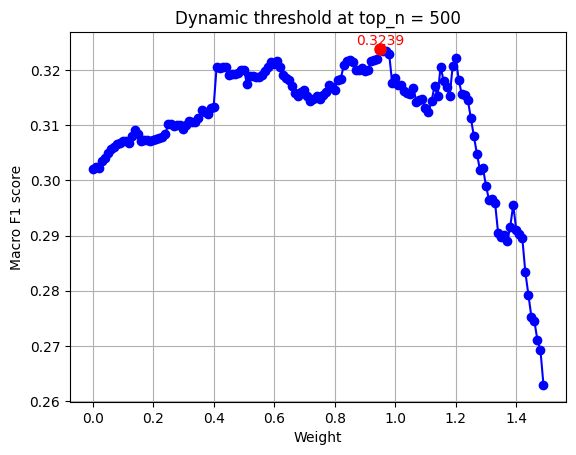

Max Macro F1 score at weight:  0.95
F1 score: 0.32389935679519166


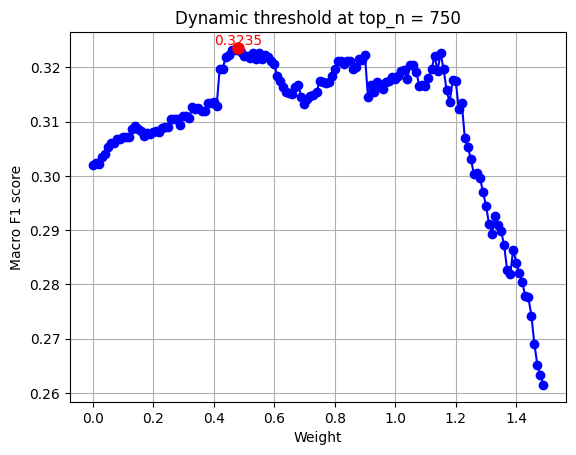

Max Macro F1 score at weight:  0.48
F1 score: 0.32347726885014944


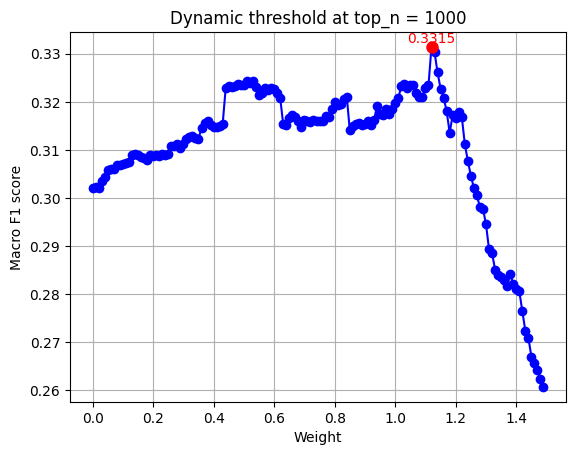

Max Macro F1 score at weight:  1.12
F1 score: 0.33149596576659335


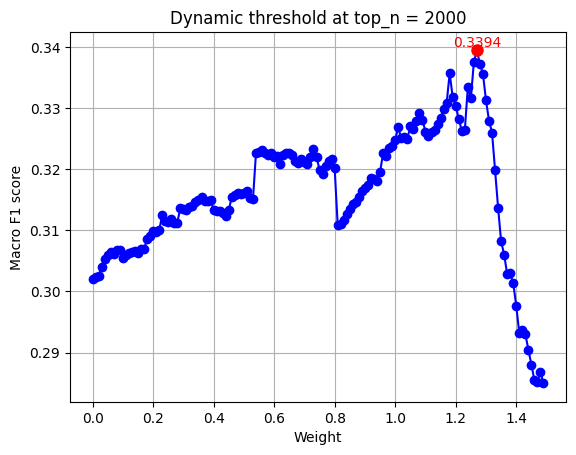

Max Macro F1 score at weight:  1.27
F1 score: 0.33942473561554065


In [ ]:
import matplotlib.pyplot as plt
import operator

ground_truth = ground_truth_easy
# ground_truth = ground_truth_hard

for top_n in [5, 25, 50, 250, 500, 750, 1000, 2000]:
  dynamic_threshold = find_dynamic_threshold(gallery, top_n )

  predict_dict = {}
  f1_weight = {}

  static_threshold = 0.7
  for w in range(0,150,1):
    for idx, query_file in enumerate(query_images):
        values_list = []
        for j in range(50):
          dt = dynamic_threshold[gallery_images[I[idx][j]].split('/')[-1].split('.')[0]]
          if D[idx][j] <= static_threshold * (1 + dt * (w * 0.01)):
              values_list += [gallery_images[I[idx][j]].split('/')[-1].split(".")[0]]
        predict_dict[query_file.split("/")[-1].split(".")[0]] = values_list


    f1_macro = f1_macro_average(ground_truth, predict_dict)
    f1_weight["{:.2f}".format(w * 0.01)] = f1_macro

  # Extract x and y values from the dictionary
  x = list(map(float, f1_weight.keys()))
  y = list(f1_weight.values())

  # Find the max value and its index
  max_value = max(y)
  min_value = min(y)
  max_index = y.index(max_value)

  # Plot
  plt.ylim(min_value-0.003, max_value + 0.003)
  plt.plot(x, y, marker='o', linestyle='-', color='b')  # Plot in blue initially
  plt.title(f'Dynamic threshold at top_n = {top_n}')
  plt.xlabel('Weight')
  plt.ylabel('Macro F1 score')
  plt.grid(True)

  # Highlight the max value in red and show iSts value
  plt.plot(x[max_index], max_value, marker='o', markersize=8, color='r')  # Red dot for max value
  plt.text(x[max_index], max_value + 0.00015, f'{max_value:.4f}', ha='center', va='bottom', color='r')

  plt.show()

  max_key = max(f1_weight.items(), key=operator.itemgetter(1))[0]
  print("Max Macro F1 score at weight: ", max_key)
  print("F1 score:", max_value)

In [ ]:
f1_weight

{'0.00': 0.30204102241473524,
 '0.01': 0.3023958633093063,
 '0.02': 0.3021793336841388,
 '0.03': 0.30355239405558637,
 '0.04': 0.3043009823395297,
 '0.05': 0.305744145492175,
 '0.06': 0.3061216094222705,
 '0.07': 0.3061216094222705,
 '0.08': 0.30677798007864115,
 '0.09': 0.30688169051258646,
 '0.10': 0.30716394376476447,
 '0.11': 0.30722232265629307,
 '0.12': 0.3074686973459711,
 '0.13': 0.30905310033793715,
 '0.14': 0.3092139017353128,
 '0.15': 0.30888218216223773,
 '0.16': 0.3085611035045302,
 '0.17': 0.30832237453492545,
 '0.18': 0.3079699754990255,
 '0.19': 0.30886664463537244,
 '0.20': 0.30866603039874846,
 '0.21': 0.3089995075144201,
 '0.22': 0.3087851071865625,
 '0.23': 0.3091619151308149,
 '0.24': 0.3089894491204864,
 '0.25': 0.3090816356652379,
 '0.26': 0.3108514530402923,
 '0.27': 0.31089680492349825,
 '0.28': 0.3111867631931753,
 '0.29': 0.31041456242097454,
 '0.30': 0.3112635373963126,
 '0.31': 0.31232689915151796,
 '0.32': 0.31275293106910534,
 '0.33': 0.3128254543312838,


## For show image

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

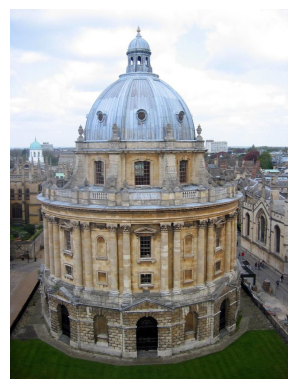

predict: True
Distance: 0.18
static_threshold: 0.70


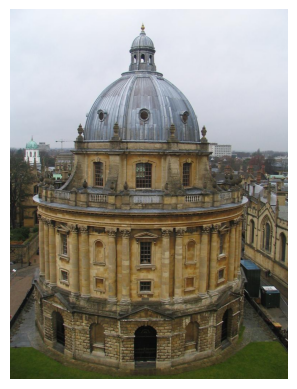

predict: True
Distance: 0.18
static_threshold: 0.70


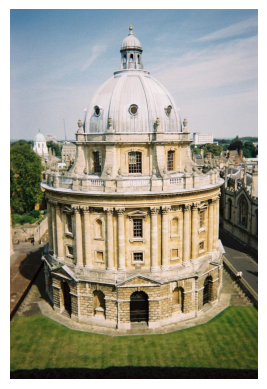

predict: True
Distance: 0.18
static_threshold: 0.70


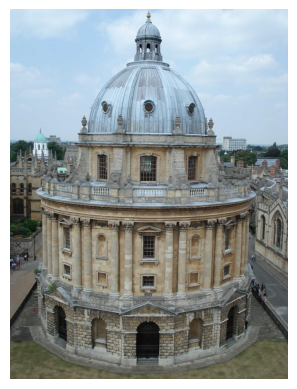

predict: True
Distance: 0.18
static_threshold: 0.70


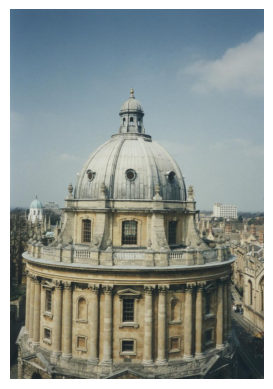

predict: True
Distance: 0.19
static_threshold: 0.70


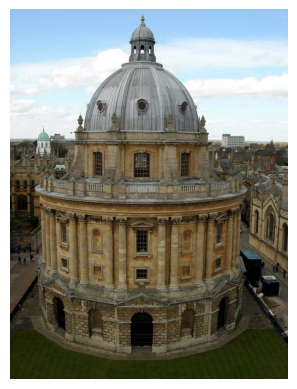

predict: True
Distance: 0.19
static_threshold: 0.70


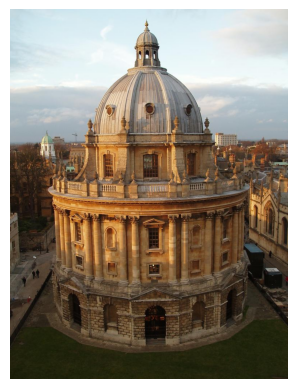

predict: True
Distance: 0.19
static_threshold: 0.70


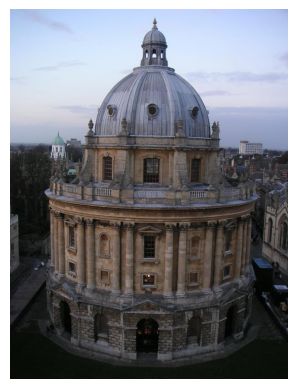

predict: True
Distance: 0.19
static_threshold: 0.70


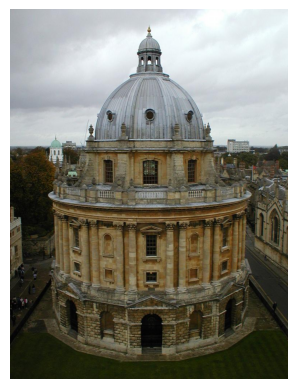

predict: True
Distance: 0.19
static_threshold: 0.70


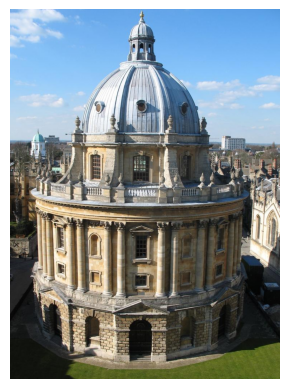

predict: True
Distance: 0.19
static_threshold: 0.70


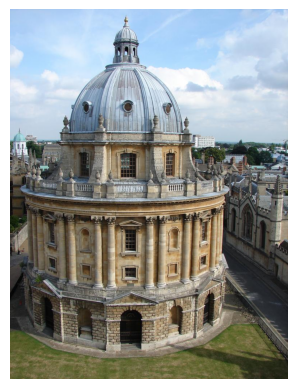

predict: True
Distance: 0.19
static_threshold: 0.70


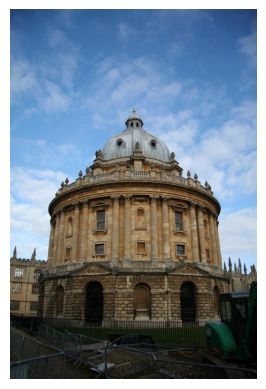

predict: True
Distance: 0.19
static_threshold: 0.70


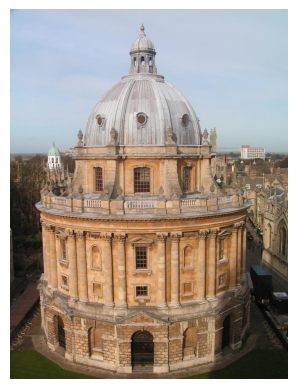

predict: True
Distance: 0.19
static_threshold: 0.70


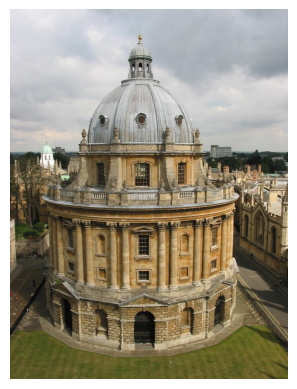

predict: True
Distance: 0.20
static_threshold: 0.70


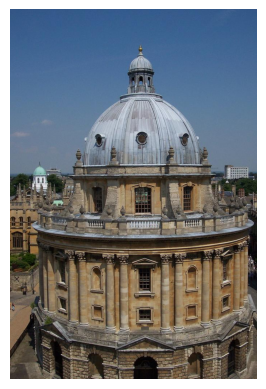

predict: True
Distance: 0.20
static_threshold: 0.70


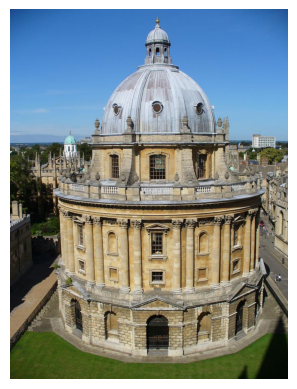

predict: True
Distance: 0.20
static_threshold: 0.70


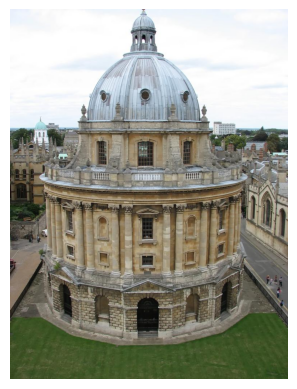

predict: True
Distance: 0.20
static_threshold: 0.70


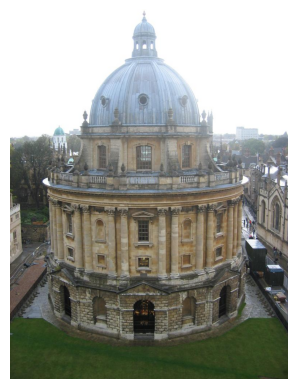

predict: True
Distance: 0.20
static_threshold: 0.70


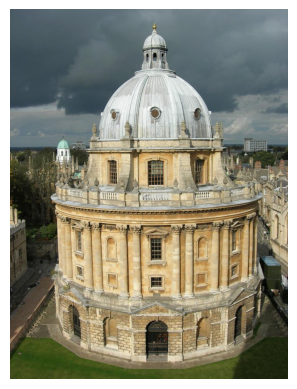

predict: True
Distance: 0.20
static_threshold: 0.70


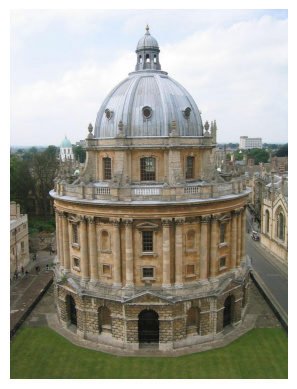

predict: True
Distance: 0.20
static_threshold: 0.70


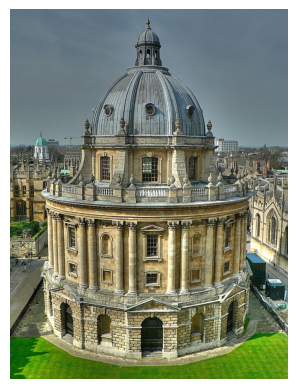

predict: True
Distance: 0.20
static_threshold: 0.70


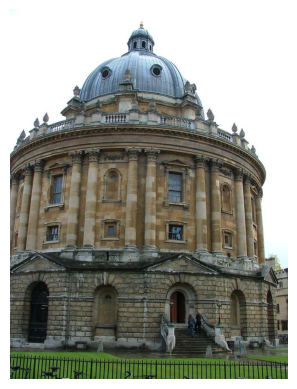

predict: True
Distance: 0.20
static_threshold: 0.70


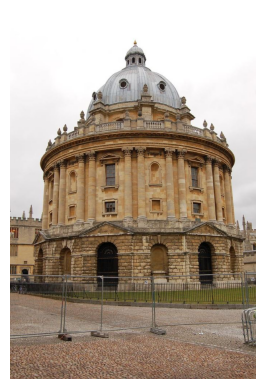

predict: True
Distance: 0.20
static_threshold: 0.70


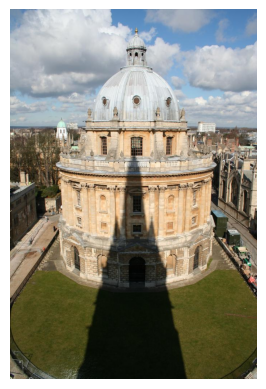

predict: True
Distance: 0.20
static_threshold: 0.70


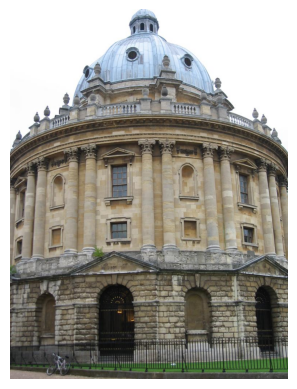

predict: True
Distance: 0.20
static_threshold: 0.70


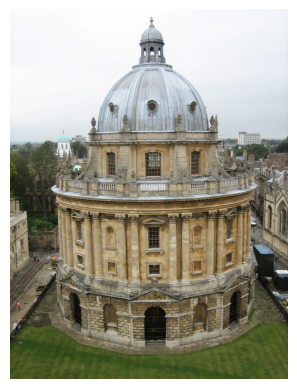

predict: True
Distance: 0.20
static_threshold: 0.70


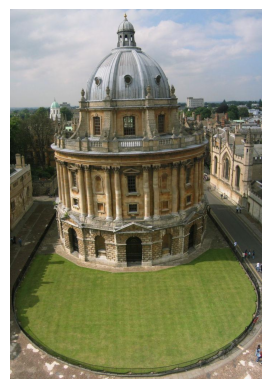

predict: True
Distance: 0.20
static_threshold: 0.70


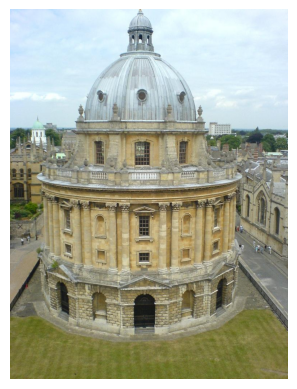

predict: True
Distance: 0.21
static_threshold: 0.70


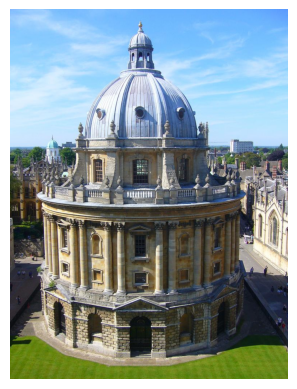

predict: True
Distance: 0.21
static_threshold: 0.70


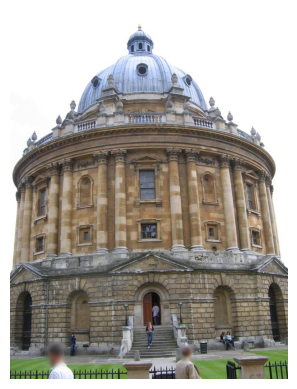

predict: True
Distance: 0.21
static_threshold: 0.70


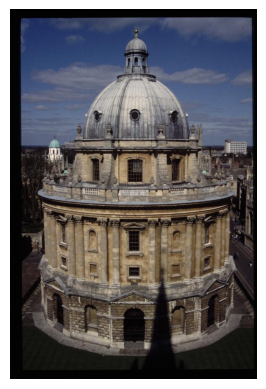

predict: True
Distance: 0.21
static_threshold: 0.70


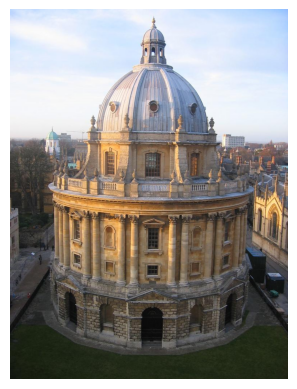

predict: True
Distance: 0.21
static_threshold: 0.70


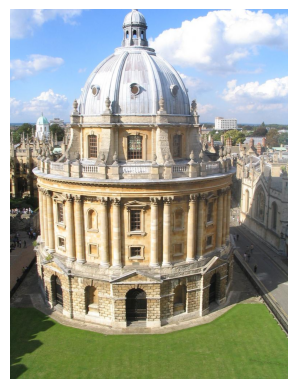

predict: True
Distance: 0.21
static_threshold: 0.70


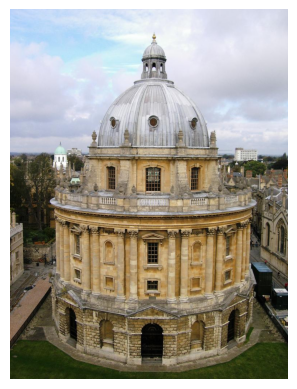

predict: True
Distance: 0.21
static_threshold: 0.70


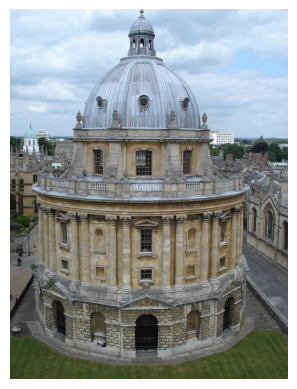

predict: True
Distance: 0.21
static_threshold: 0.70


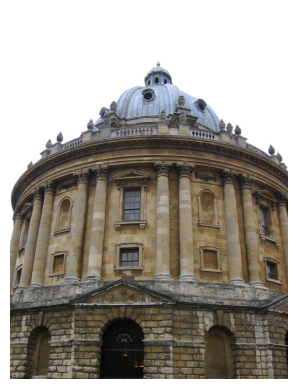

predict: True
Distance: 0.21
static_threshold: 0.70


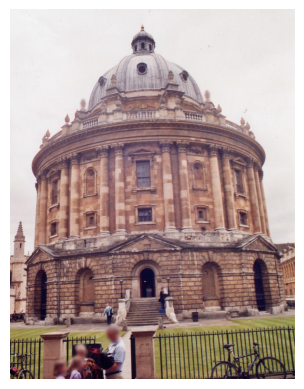

predict: True
Distance: 0.21
static_threshold: 0.70


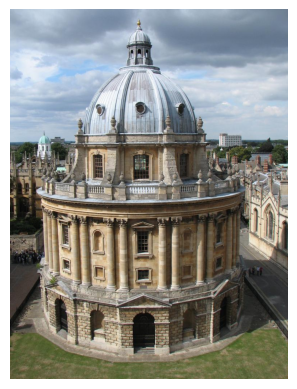

predict: True
Distance: 0.21
static_threshold: 0.70


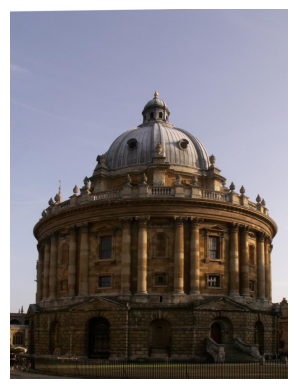

predict: True
Distance: 0.21
static_threshold: 0.70


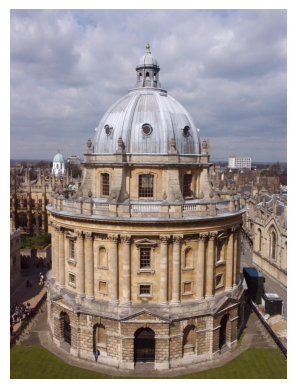

predict: True
Distance: 0.21
static_threshold: 0.70


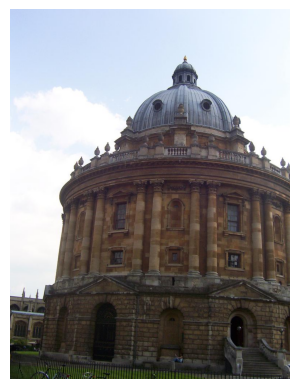

predict: True
Distance: 0.21
static_threshold: 0.70


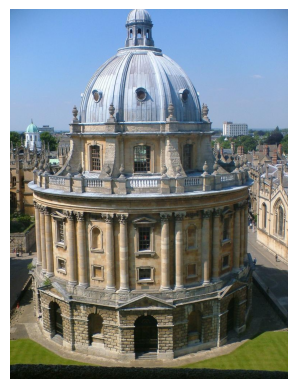

predict: True
Distance: 0.21
static_threshold: 0.70


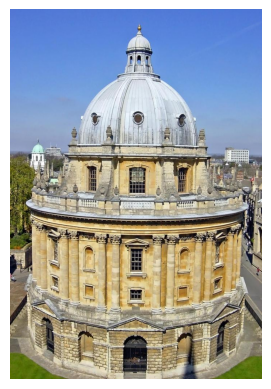

predict: True
Distance: 0.21
static_threshold: 0.70


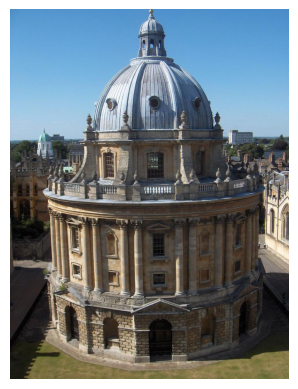

predict: True
Distance: 0.21
static_threshold: 0.70


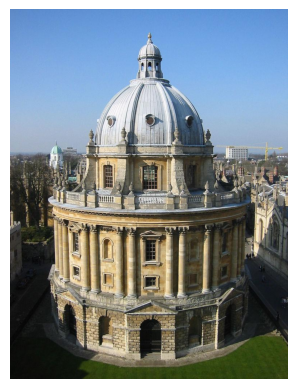

predict: True
Distance: 0.21
static_threshold: 0.70


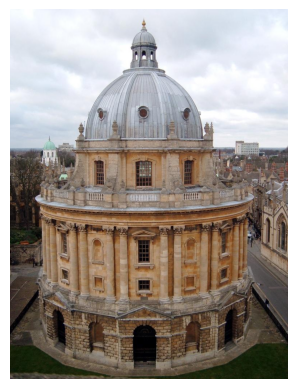

predict: True
Distance: 0.21
static_threshold: 0.70


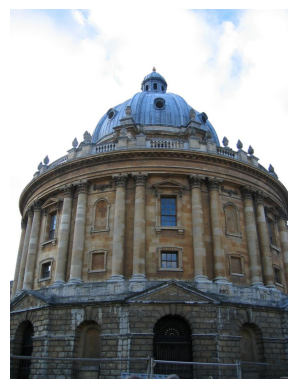

predict: True
Distance: 0.21
static_threshold: 0.70


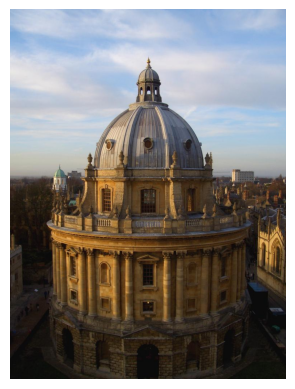

predict: True
Distance: 0.22
static_threshold: 0.70


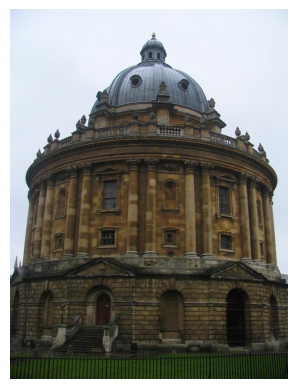

predict: True
Distance: 0.22
static_threshold: 0.70


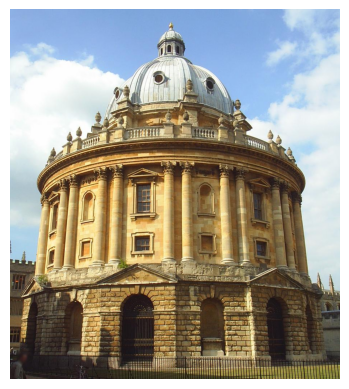

predict: True
Distance: 0.22
static_threshold: 0.70


'oxford5k/gallery/radcliffe_camera_000249.jpg'

In [ ]:
ground_truth = ground_truth_easy

predict_dict = {}
static_threshold = 0.7

query_file = query_images[0]
for j in range(50):
  choose = 0
  dis = D[idx][j]
  if dis <= static_threshold:
      choose = 1
  image_url = gallery_images[I[idx][j]]
  img = Image.open(image_url)
  plt.imshow(img)
  plt.axis('off')  # Hide the axis
  plt.show()
  if choose:
    print('predict: True')
  else:
    print('predict: False')
  print(f'Distance: {dis:.2f}\nstatic_threshold: {static_threshold:.2f}')
image_url

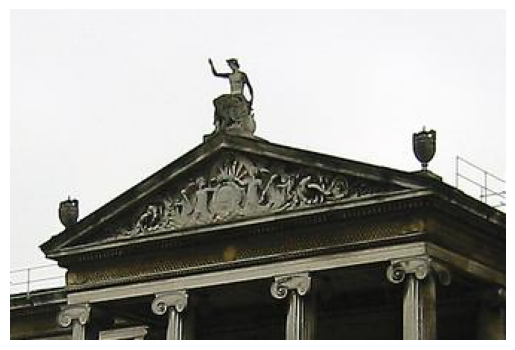

In [ ]:
query_file = query_images[13]
img = Image.open(query_file)
plt.imshow(img)
plt.axis('off')  # Hide the axis
plt.show()

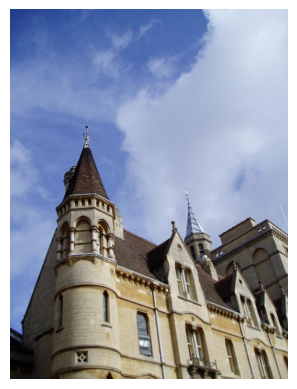

predict: True
Distance: 0.380
dynamic_threshold: 0.59
url:oxford5k/gallery/oxford_001949.jpg


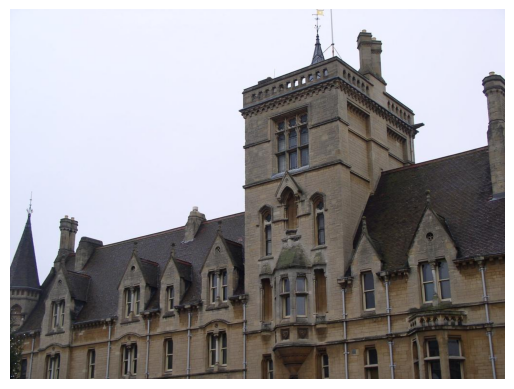

predict: True
Distance: 0.381
dynamic_threshold: 0.48
url:oxford5k/gallery/oxford_002841.jpg


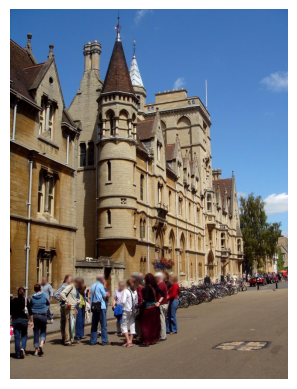

predict: True
Distance: 0.391
dynamic_threshold: 0.48
url:oxford5k/gallery/oxford_000174.jpg


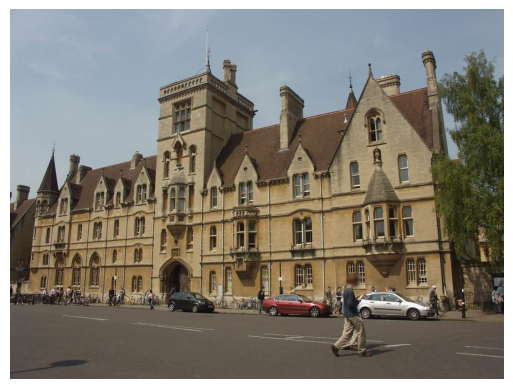

predict: True
Distance: 0.405
dynamic_threshold: 0.48
url:oxford5k/gallery/balliol_000085.jpg


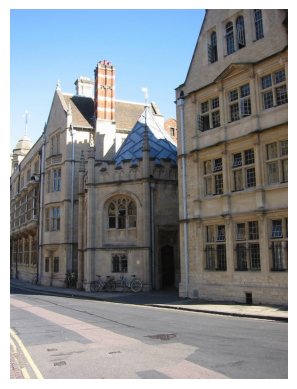

predict: True
Distance: 0.414
dynamic_threshold: 0.42
url:oxford5k/gallery/hertford_000119.jpg


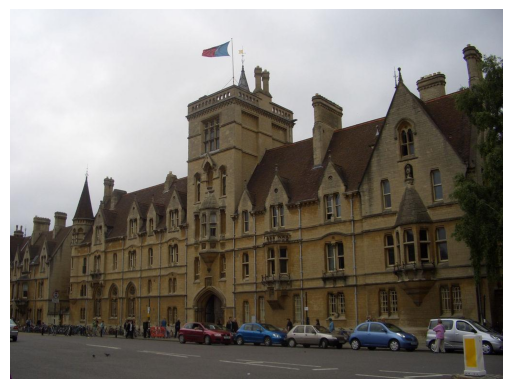

predict: True
Distance: 0.415
dynamic_threshold: 0.49
url:oxford5k/gallery/balliol_000075.jpg


KeyboardInterrupt: 

In [ ]:
ground_truth = ground_truth_easy

predict_dict = {}
static_threshold = 0.7

idx = 15
query_file = query_images[idx]
for j in range(300):
  choose = 0
  dis = D[idx][j]
  top_n = 500
  dynamic_threshold = find_dynamic_threshold(gallery, top_n )
  dt = dynamic_threshold[gallery_images[I[idx][j]].split('/')[-1].split('.')[0]]
  w = 1
  new_threshold = static_threshold * (1 + dt * (w))
  if dis <= new_threshold:
      choose = 1
  image_url = gallery_images[I[idx][j]]
  img = Image.open(image_url)
  plt.imshow(img)
  plt.axis('off')  # Hide the axis
  plt.show()
  if choose:
    print('predict: True')
  else:
    print('predict: False')
  print(f'Distance: {dis:.3f}\ndynamic_threshold: {new_threshold:.2f}')
  print(f'url:{image_url}')
image_url

# Eval Transform (Not used)

In [ ]:
ground_truth_dict = {}

In [ ]:
df = pd.read_csv('rparis5k/ground_truth.csv')
df.head()

,Unnamed: 0,bbx,easy,hard,junk,qname,easy_name,hard_name,junk_name
0,0,"[130, 17, 843, 732]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000605,"['paris_defense_000060', 'paris_defense_000280...","['paris_defense_000101', 'paris_defense_000353...","['paris_defense_000077', 'paris_general_002374..."
1,1,"[258, 88, 805, 619]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000331,"['paris_defense_000060', 'paris_defense_000280...","['paris_defense_000101', 'paris_defense_000353...","['paris_defense_000077', 'paris_general_002374..."
2,2,"[213, 67, 765, 609]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000216,"['paris_defense_000060', 'paris_defense_000280...","['paris_defense_000101', 'paris_defense_000353...","['paris_defense_000077', 'paris_general_002374..."
3,3,"[8, 104, 707, 913]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000056,"['paris_defense_000060', 'paris_defense_000280...","['paris_defense_000101', 'paris_defense_000353...","['paris_defense_000077', 'paris_general_002374..."
4,4,"[226, 77, 645, 510]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000254,"['paris_defense_000060', 'paris_defense_000280...","['paris_defense_000101', 'paris_defense_000353...","['paris_defense_000077', 'paris_general_002374..."


## Easy + Hard

In [ ]:
for i in range(len(df)):
  easy_list = df.iloc[i]['easy_name'].replace("'","").strip("[]").split(", ")
  hard_list = df.iloc[i]['hard_name'].replace("'","").strip("[]").split(", ")
  correct_list = easy_list + hard_list
  correct_filter_list = [item for item in correct_list if item != '']
  ground_truth_dict[df.iloc[i]['qname']] = correct_filter_list

ground_truth_dict

In [ ]:
with open("ground_truth_easy_hard.json", "w") as file:
  json.dump(ground_truth_dict, file)

In [ ]:
!cp /content/ground_truth_easy_hard.json -r /content/drive/MyDrive/Dataset/rparis6k

## Easy

In [ ]:
for i in range(len(df)):
  easy_list = df.iloc[i]['easy_name'].replace("'","").strip("[]").split(", ")
  correct_list = easy_list
  correct_filter_list = [item for item in correct_list if item != '']
  ground_truth_dict[df.iloc[i]['qname']] = correct_filter_list

ground_truth_dict

In [ ]:
with open("ground_truth_easy.json", "w") as file:
  json.dump(ground_truth_dict, file)

In [ ]:
!cp /content/ground_truth_easy.json -r /content/drive/MyDrive/Dataset/rparis6k

# Eval Transform (Not used)


In [ ]:
with open('rparis6k/data.json') as json_file:
  eval_dict = json.load(json_file)
eval_dict.keys()

dict_keys(['gnd', 'imlist', 'qimlist', 'gnd_fname', 'ext', 'qext', 'dir_data', 'dir_images', 'n', 'nq', 'im_fname', 'qim_fname', 'dataset'])

In [ ]:
eval_dict['gnd']

In [ ]:
submission = dict()

# D = D.flatten()
# I = I.flatten()
static_threshold = 1

for idx, query_file in enumerate(query_images):
  print(f"\nQuery {idx} :",query_file.split("/")[-1])
  for j in range(8):
    if D[idx][j] <= static_threshold:
          print("   Found (Gall) :", gallery_images[I[idx][j]].split('/')[-1].split(".")[0],"dis",D[idx][j])
          # print("   Found (Eval) :", eval_dict['imlist'][I[idx][j]],"dis",D[idx][j])
    # if D[idx] <= static_threshold * (1 + DT[I[idx]] * 1.53):
    #     print(I[idx])
        # submission[query_file.split("/")[-1]] = int(+[I[idx]].split("/")[-1].split(".")[0])
    # else:
        # submission[query_file.split("/")[-1]] = 22


Query 0 : all_souls_000013.jpg
   Found (Gall) : all_souls_000015 dis 0.28072262
   Found (Gall) : all_souls_000055 dis 0.28110552
   Found (Gall) : all_souls_000126 dis 0.28267038
   Found (Gall) : all_souls_000002 dis 0.324167
   Found (Gall) : oxford_002503 dis 0.32921576
   Found (Gall) : all_souls_000146 dis 0.33116376
   Found (Gall) : all_souls_000150 dis 0.3358147
   Found (Gall) : oxford_002338 dis 0.33613276

Query 1 : all_souls_000021.jpg
   Found (Gall) : all_souls_000055 dis 0.3741064
   Found (Gall) : oxford_002338 dis 0.37790775
   Found (Gall) : oxford_002503 dis 0.38655484
   Found (Gall) : all_souls_000091 dis 0.38795543
   Found (Gall) : all_souls_000150 dis 0.39980412
   Found (Gall) : all_souls_000006 dis 0.40939426
   Found (Gall) : all_souls_000206 dis 0.40953183
   Found (Gall) : oxford_002358 dis 0.4129864

Query 2 : all_souls_000022.jpg
   Found (Gall) : balliol_000189 dis 0.5809363
   Found (Gall) : oxford_003388 dis 0.6021012
   Found (Gall) : oriel_000004 

In [ ]:
df = pd.DataFrame.from_dict(eval_dict['gnd'])
df

,bbx,easy,hard,junk
0,"[130, 17, 843, 732]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7..."
1,"[258, 88, 805, 619]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7..."
2,"[213, 67, 765, 609]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7..."
3,"[8, 104, 707, 913]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7..."
4,"[226, 77, 645, 510]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7..."
...,...,...,...,...
65,"[37.7, 309.1, 663.4, 876.0]","[1006, 2254, 2620, 4676, 6156, 6248]","[9, 12, 206, 242, 424, 437, 462, 514, 536, 566...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6..."
66,"[0.0, 43.7, 1023.0, 575.5]","[242, 424, 437, 462, 536, 566, 567, 586, 842, ...","[9, 12, 206, 514, 664, 712, 714, 1006, 1088, 1...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6..."
67,"[0, 0, 677, 1023]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10..."
68,"[409.3, 287.3, 693.6, 774.0]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10..."


In [ ]:
df['qname'] = eval_dict['qimlist']

In [ ]:
df

,bbx,easy,hard,junk,qname
0,"[130, 17, 843, 732]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000605
1,"[258, 88, 805, 619]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000331
2,"[213, 67, 765, 609]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000216
3,"[8, 104, 707, 913]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000056
4,"[226, 77, 645, 510]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000254
...,...,...,...,...,...
65,"[37.7, 309.1, 663.4, 876.0]","[1006, 2254, 2620, 4676, 6156, 6248]","[9, 12, 206, 242, 424, 437, 462, 514, 536, 566...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_001078
66,"[0.0, 43.7, 1023.0, 575.5]","[242, 424, 437, 462, 536, 566, 567, 586, 842, ...","[9, 12, 206, 514, 664, 712, 714, 1006, 1088, 1...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_000642
67,"[0, 0, 677, 1023]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000089
68,"[409.3, 287.3, 693.6, 774.0]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000414


In [ ]:
def idex_to_filename(idx):
  print(eval_dict['imlist'][idx])

idex_to_filename(0)

paris_general_001840


In [ ]:
easy_name = []
for i in range(len(df)):
  easy = df['easy'].iloc[i]
  easy_each_i_name = []
  for each_easy in easy:
    easy_each_i_name += [eval_dict['imlist'][each_easy]]
  easy_name += [list(easy_each_i_name)]


hard_name = []
for i in range(len(df)):
  hard = df['hard'].iloc[i]
  hard_each_i_name = []
  for each_hard in hard:
    hard_each_i_name += [eval_dict['imlist'][each_hard]]
  hard_name += [list(hard_each_i_name)]


junk_name = []
for i in range(len(df)):
  junk = df['junk'].iloc[i]
  junk_each_i_name = []
  for each_junk in junk:
    junk_each_i_name += [eval_dict['imlist'][each_junk]]
  junk_name += [list(junk_each_i_name)]

In [ ]:
df['easy_name'] = easy_name
df['hard_name'] = hard_name
df['junk_name'] = junk_name
df

,bbx,easy,hard,junk,qname,easy_name,hard_name,junk_name
0,"[130, 17, 843, 732]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000605,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
1,"[258, 88, 805, 619]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000331,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
2,"[213, 67, 765, 609]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000216,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
3,"[8, 104, 707, 913]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000056,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
4,"[226, 77, 645, 510]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000254,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
...,...,...,...,...,...,...,...,...
65,"[37.7, 309.1, 663.4, 876.0]","[1006, 2254, 2620, 4676, 6156, 6248]","[9, 12, 206, 242, 424, 437, 462, 514, 536, 566...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_001078,"[paris_pantheon_000653, paris_pantheon_000159,...","[paris_pantheon_000274, paris_pantheon_000990,...","[paris_pantheon_001028, paris_pantheon_000452,..."
66,"[0.0, 43.7, 1023.0, 575.5]","[242, 424, 437, 462, 536, 566, 567, 586, 842, ...","[9, 12, 206, 514, 664, 712, 714, 1006, 1088, 1...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_000642,"[paris_pantheon_000889, paris_pantheon_000780,...","[paris_pantheon_000274, paris_pantheon_000990,...","[paris_pantheon_001028, paris_pantheon_000452,..."
67,"[0, 0, 677, 1023]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000089,"[paris_triomphe_000700, paris_triomphe_000465,...","[paris_triomphe_000066, paris_triomphe_000442,...","[paris_triomphe_001088, paris_triomphe_000456,..."
68,"[409.3, 287.3, 693.6, 774.0]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000414,"[paris_triomphe_000700, paris_triomphe_000465,...","[paris_triomphe_000066, paris_triomphe_000442,...","[paris_triomphe_001088, paris_triomphe_000456,..."


In [ ]:
df

,bbx,easy,hard,junk,qname,easy_name,hard_name,junk_name
0,"[130, 17, 843, 732]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000605,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
1,"[258, 88, 805, 619]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000331,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
2,"[213, 67, 765, 609]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000216,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
3,"[8, 104, 707, 913]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000056,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
4,"[226, 77, 645, 510]","[85, 148, 210, 211, 220, 277, 290, 299, 334, 4...","[114, 116, 117, 121, 146, 180, 252, 373, 399, ...","[95, 350, 353, 360, 363, 432, 504, 665, 672, 7...",paris_defense_000254,"[paris_defense_000060, paris_defense_000280, p...","[paris_defense_000101, paris_defense_000353, p...","[paris_defense_000077, paris_general_002374, p..."
...,...,...,...,...,...,...,...,...
65,"[37.7, 309.1, 663.4, 876.0]","[1006, 2254, 2620, 4676, 6156, 6248]","[9, 12, 206, 242, 424, 437, 462, 514, 536, 566...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_001078,"[paris_pantheon_000653, paris_pantheon_000159,...","[paris_pantheon_000274, paris_pantheon_000990,...","[paris_pantheon_001028, paris_pantheon_000452,..."
66,"[0.0, 43.7, 1023.0, 575.5]","[242, 424, 437, 462, 536, 566, 567, 586, 842, ...","[9, 12, 206, 514, 664, 712, 714, 1006, 1088, 1...","[57, 126, 235, 316, 326, 411, 464, 531, 608, 6...",paris_pantheon_000642,"[paris_pantheon_000889, paris_pantheon_000780,...","[paris_pantheon_000274, paris_pantheon_000990,...","[paris_pantheon_001028, paris_pantheon_000452,..."
67,"[0, 0, 677, 1023]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000089,"[paris_triomphe_000700, paris_triomphe_000465,...","[paris_triomphe_000066, paris_triomphe_000442,...","[paris_triomphe_001088, paris_triomphe_000456,..."
68,"[409.3, 287.3, 693.6, 774.0]","[540, 907, 1074, 1234, 1305, 1609, 1814, 1912,...","[19, 79, 104, 172, 196, 213, 244, 254, 314, 37...","[83, 98, 156, 230, 343, 515, 529, 865, 890, 10...",paris_triomphe_000414,"[paris_triomphe_000700, paris_triomphe_000465,...","[paris_triomphe_000066, paris_triomphe_000442,...","[paris_triomphe_001088, paris_triomphe_000456,..."


In [ ]:
df.to_csv('ground_truth.csv')

In [ ]:
!cp ground_truth.csv -r /content/drive/MyDrive/Dataset/rparis6k